In [1]:
import datetime, time
import simpy

import shapely.geometry
import pandas as pd
import numpy as np

import openclsim.core as core
import openclsim.model as model
import openclsim.plot as plot
import openclsim.plugins as plugin

from plotly.offline import init_notebook_mode, iplot
import plotly.graph_objs as go

init_notebook_mode(connected=True)

In [2]:
Site = type(
    "Site",
    (
        core.Identifiable,
        core.Log,
        core.Locatable,
        core.HasContainer,
        core.HasResource,
    ),
    {},
)
TransportProcessingResource = type(
    "TransportProcessingResource",
    (
        core.Identifiable,
        core.Log,
        core.ContainerDependentMovable,
        core.Processor,
        core.HasResource,  # NB: LoadingFunction and UnloadingFunction are not mixed in
    ),
    {},
)
TestMoveActivity =  type(
    "TestMoveActivity",
    (
        plugin.HasWeatherPluginActivity,
        model.MoveActivity,  # the order is critical!
    ),
    {},
)
TestShiftActivity =  type(
    "TestShiftActivity",
    (
        plugin.HasWeatherPluginActivity,
        model.ShiftAmountActivity,  # the order is critical!
    ),
    {},
)

In [3]:
def run(year):
    simulation_start  = datetime.datetime(year, 1, 1, 0, 0)
    my_env = simpy.Environment(initial_time=simulation_start.timestamp())

    # prepare input data for from_site
    location_from_site = shapely.geometry.Point(4.18055556, 52.18664444)
    data_from_site = {"env": my_env,
                      "name": "from_site",
                      "geometry": location_from_site,
                      "capacity": 120,
                      "level": 120
                     }
    # instantiate from_site 
    from_site = Site(**data_from_site)

    # prepare input data for to_site
    location_to_site = shapely.geometry.Point(4.25222222, 52.11428333)
    data_to_site = {"env": my_env,
                    "name": "to_site",
                    "geometry": location_to_site,
                    "capacity": 120,
                    "level": 0
                   }
    # instantiate to_site 
    to_site = Site(**data_to_site)

    # prepare input data for vessel_01
    data_vessel01 = {"env": my_env,
                     "name": "vessel01",
                     "geometry": location_from_site, 
                     "capacity": 4,
                     "compute_v": lambda x: 10
                   }
    # instantiate vessel_01 
    vessel01 = TransportProcessingResource(**data_vessel01)

    # generate a dataframe with weather data
    metocean_df = pd.read_csv("weather 1993-2018.csv")
    metocean_df = metocean_df.set_index(pd.to_datetime(metocean_df["index"], dayfirst=True))
    metocean_df = metocean_df.sort_index()
    metocean_df["ts"] = metocean_df.index.values.astype(float) / 1_000_000_000
    metocean_df[metocean_df.index.year == year]

    # generate a weather criterion for the sailing process
    sailing_crit = plugin.WeatherCriterion(
        name="sailing_crit",
        condition="Hm0 [m]",
        maximum=2,
        window_length=3600,
    )

    # generate a weather criterion for the loading process
    loading_crit = plugin.WeatherCriterion(
        name="loading_crit",
        condition="Hm0 [m]",
        maximum=1.5,
        window_length=3600,
    )

    # initialise registry
    registry = {}

    # create a list of the sub processes
    sub_processes = [
        TestMoveActivity(
            env=my_env,
            name="sailing empty",
            registry=registry,
            mover=vessel01,
            destination=from_site,
            metocean_criteria=sailing_crit,
            metocean_df=metocean_df,
        ),
        TestShiftActivity(
            env=my_env,
            name="loading",
            registry=registry,
            processor=vessel01,
            origin=from_site,
            destination=vessel01,
            amount=4,
            duration=3600,
            metocean_criteria=loading_crit,
            metocean_df=metocean_df,
        ),
        TestMoveActivity(
            env=my_env,
            name="sailing full",
            registry=registry,
            mover=vessel01,
            destination=to_site,
            metocean_criteria=sailing_crit,
            metocean_df=metocean_df,
        ),
        TestShiftActivity(
            env=my_env,
            name="unloading",
            registry=registry,
            processor=vessel01,
            origin=vessel01,
            destination=to_site,
            amount=4,
            duration=3600,
            metocean_criteria=loading_crit,
            metocean_df=metocean_df,
        ),
    ]

    # create a 'sequential activity' that is made up of the 'sub_processes'
    sequential_activity = model.SequentialActivity(
        env=my_env,
        name="sequential_activity_subcycle",
        registry=registry,
        sub_processes=sub_processes,
    )

    # create a while activity that executes the 'sequential activity' while the stop condition is not triggered 
    while_activity = model.WhileActivity(
        env=my_env,
        name="while_sequential_activity_subcycle",
        registry=registry,
        sub_processes=[sequential_activity],
        condition_event=[{"type": "container", "concept": to_site, "state": "full"}],
    )


    model.register_processes([while_activity])
    my_env.run()
    
    
    return {
        "env":my_env,
        "registry":registry,
        "from_site":from_site,
        "to_site":to_site,
        "vessel01":vessel01,
        "loading_crit":loading_crit,
        "sailing_crit":sailing_crit,
    }

In [4]:
years = range(1993,2017)

In [5]:
%%time
results = []
for year in years:
    results.append(run(year))

CPU times: user 39 s, sys: 838 ms, total: 39.8 s
Wall time: 39.8 s


In [12]:
result = results[10]

env = result['env']
registry = result['registry']
from_site = result['from_site']
to_site = result['to_site']
vessel01 = result['vessel01']
loading_crit = result['loading_crit']
sailing_crit = result['sailing_crit']

while_activity = list(registry['name']["while_sequential_activity_subcycle"])[0]
sub_processes = while_activity.sub_processes

metocean_df = pd.read_csv("weather 1993-2018.csv")
metocean_df = metocean_df.set_index(pd.to_datetime(metocean_df["index"], dayfirst=True))
metocean_df = metocean_df.sort_index()
metocean_df["ts"] = metocean_df.index.values.astype(float) / 1_000_000_000

In [15]:
res = plot.get_gantt_chart([vessel01], y_scale="numbers", static=True, id_map=[while_activity])
data = res['data']
layout = res['layout']

data.append({
    "name": "sailing_crit",
    "x":[vessel01.log["Timestamp"][0].isoformat(), vessel01.log["Timestamp"][-1].isoformat()],
    "y":[sailing_crit.maximum,sailing_crit.maximum],
})

data.append({
    "name": "Weather",
    "x":metocean_df.index,
    "y":metocean_df[sailing_crit.condition],
})

data.append({
    "name": "loading_crit",
    "x":[vessel01.log["Timestamp"][0].isoformat(), vessel01.log["Timestamp"][-1].isoformat()],
    "y":[loading_crit.maximum,loading_crit.maximum],
})

go.Figure(data=data, layout=layout)

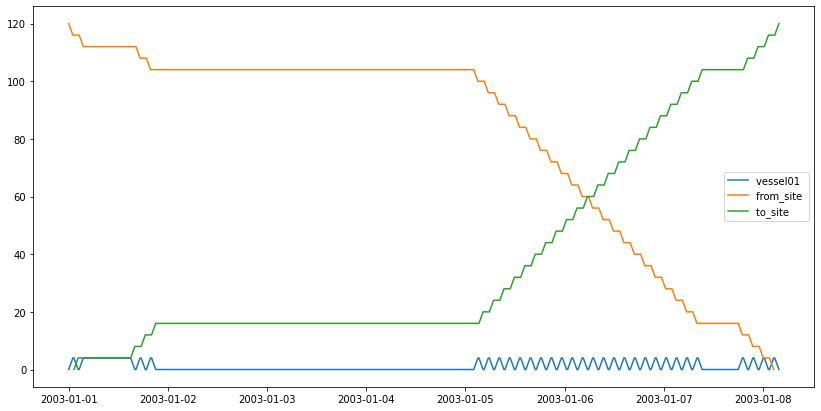

In [17]:
fig = plot.get_step_chart([vessel01, from_site, to_site])